### Hists for temporal distribution

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import numpy as np

In [162]:
def list_dates(subset_dir):
    subset_list = os.listdir(subset_dir)
    date_list = []
    for subset in subset_list:
        date_list.append(pd.to_datetime(subset.split('_')[4]))
    return date_list

In [163]:
aso_utm10_dates = list_dates(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm10n")
aso_utm11_dates =list_dates(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm11n")
aso_utm12_dates =list_dates(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm12n")
aso_utm13_dates =list_dates(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm13n")

In [164]:
import numpy as np
np.linspace(2016,2023,8)

array([2016., 2017., 2018., 2019., 2020., 2021., 2022., 2023.])

C:\Users\JackE\AppData\Local\Temp\ipykernel_28480\2377626791.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), ha='right')


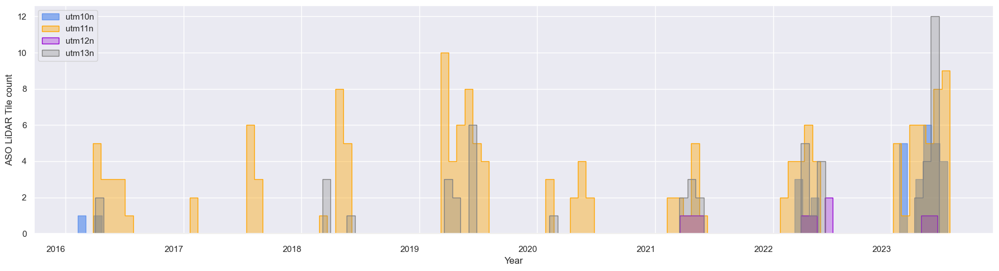

In [165]:
sns.set_theme()
f, ax = plt.subplots(figsize=(18, 5))
sns.histplot(ax=ax, x=aso_utm10_dates, binwidth=25, element='step', fill='cornflowerblue', color='cornflowerblue', alpha=0.7, label='utm10n')
sns.histplot(ax=ax, x=aso_utm11_dates, binwidth=25, element='step', fill='orange', color='orange', alpha=0.4, label='utm11n')
sns.histplot(ax=ax, x=aso_utm12_dates, binwidth=25, element='step', fill='purple', color='darkviolet', alpha=0.3, label='utm12n')
sns.histplot(ax=ax, x=aso_utm13_dates, binwidth=25, element='step', fill='gray', color='gray', alpha=0.3, label='utm13n')
ax.set_ylabel('ASO LiDAR Tile count')
ax.set_xlabel('Year')
ax.set_xticklabels(ax.get_xticklabels(), ha='right')
ax.tick_params(axis='x', which='major', pad=10)  # Adds padding below x-axis labels
plt.legend(loc='upper left')
plt.tight_layout()

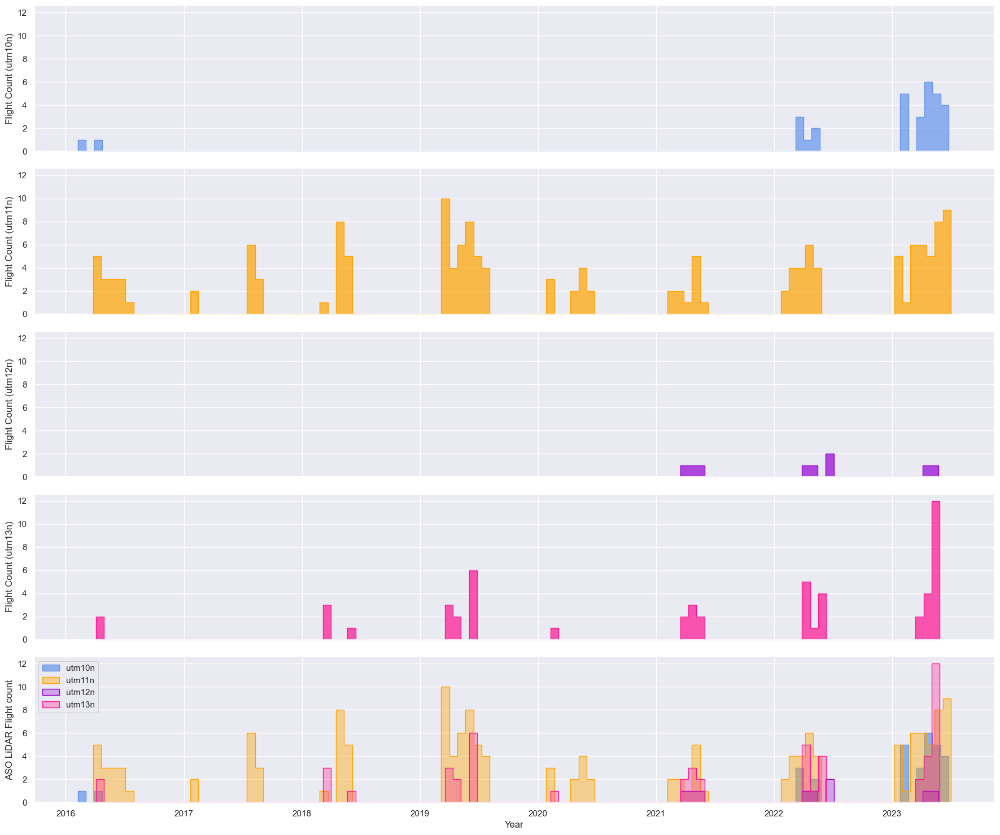

In [166]:
sns.set_theme()

# Create subplots with 5 rows and 1 column
fig, axes = plt.subplots(5, 1, figsize=(18, 15), sharex=True, sharey=True)

# Plot individual datasets on separate subplots
sns.histplot(ax=axes[0], x=aso_utm10_dates, binwidth=25, element='step', fill='cornflowerblue', color='cornflowerblue', alpha=0.7)
axes[0].set_ylabel('Flight Count (utm10n)')
axes[0].set_xlabel('Year')

sns.histplot(ax=axes[1], x=aso_utm11_dates, binwidth=25, element='step', fill='orange', color='orange', alpha=0.7)
axes[1].set_ylabel('Flight Count (utm11n)')
axes[1].set_xlabel('Year')

sns.histplot(ax=axes[2], x=aso_utm12_dates, binwidth=25, element='step', fill='purple', color='darkviolet', alpha=0.7)
axes[2].set_ylabel('Flight Count (utm12n)')
axes[2].set_xlabel('Year')

sns.histplot(ax=axes[3], x=aso_utm13_dates, binwidth=25, element='step', fill='deeppink', color='deeppink', alpha=0.7)
axes[3].set_ylabel('Flight Count (utm13n)')
axes[3].set_xlabel('Year')

# Plot all datasets together in the last subplot
sns.histplot(ax=axes[4], x=aso_utm10_dates, binwidth=25, element='step', fill='cornflowerblue', color='cornflowerblue', alpha=0.7, label='utm10n')
sns.histplot(ax=axes[4], x=aso_utm11_dates, binwidth=25, element='step', fill='orange', color='orange', alpha=0.4, label='utm11n')
sns.histplot(ax=axes[4], x=aso_utm12_dates, binwidth=25, element='step', fill='purple', color='darkviolet', alpha=0.3, label='utm12n')
sns.histplot(ax=axes[4], x=aso_utm13_dates, binwidth=25, element='step', fill='deeppink', color='deeppink', alpha=0.3, label='utm13n')
axes[4].set_ylabel('ASO LiDAR Flight count')
axes[4].set_xlabel('Year')
axes[4].legend(loc='upper left')

# Adjust layout for better spacing
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\hist.png", dpi=300, bbox_inches='tight')
plt.show()

### Maps

In [167]:
import rasterio
import xarray as xr
import contextily as ctx
from matplotlib.patches import Rectangle
from tqdm import tqdm
from shapely.geometry import box
import geopandas as gpd

In [168]:
def get_bounds_gf(path):
    result_gf = gpd.GeoDataFrame(geometry='geometry', columns=['geometry'], crs=3857)
    # List all .tif files in the directory
    tif_files = [os.path.join(path, f) for f in os.listdir(path) if f.endswith('.tif')]
    # Iterate over each tif file
    for tif_file in tif_files:
        with rasterio.open(tif_file) as src:
            # Get the bounds of the tif file (left, bottom, right, top)
            bounds = src.bounds
            bounds_box = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
            gf_bounds = gpd.GeoDataFrame(geometry=[bounds_box], columns=['geometry'] ,crs=src.crs)
            gf_bounds = gf_bounds.to_crs(3857)
            result_gf = pd.concat([result_gf, gf_bounds], ignore_index=True)
    return result_gf.reset_index(drop=True)

In [169]:
gf_utm10_bounds = get_bounds_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm10n")
gf_utm11_bounds = get_bounds_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm11n")
gf_utm12_bounds = get_bounds_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm12n")
gf_utm13_bounds = get_bounds_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm13n")

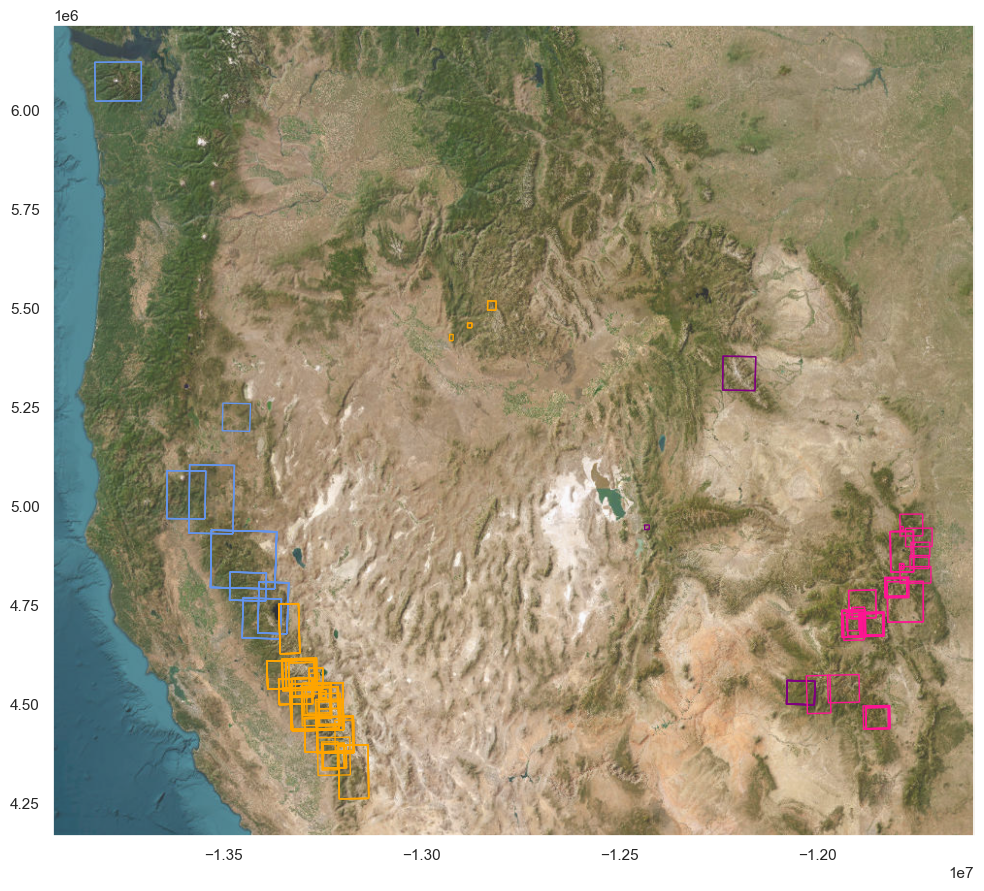

In [98]:
fig, ax = plt.subplots(figsize=(10, 10))
gf_utm10_bounds.plot(ax=ax, facecolor='none', edgecolor='cornflowerblue')
gf_utm11_bounds.plot(ax=ax, facecolor='none', edgecolor='orange')
gf_utm12_bounds.plot(ax=ax, facecolor='none', edgecolor='purple')
gf_utm13_bounds.plot(ax=ax, facecolor='none', edgecolor='deeppink')
ctx.add_basemap(ax, crs=3857, source=ctx.providers.Esri.WorldImagery, alpha=0.8, attribution=False)
ax.grid(False)
plt.tight_layout()
plt.show()

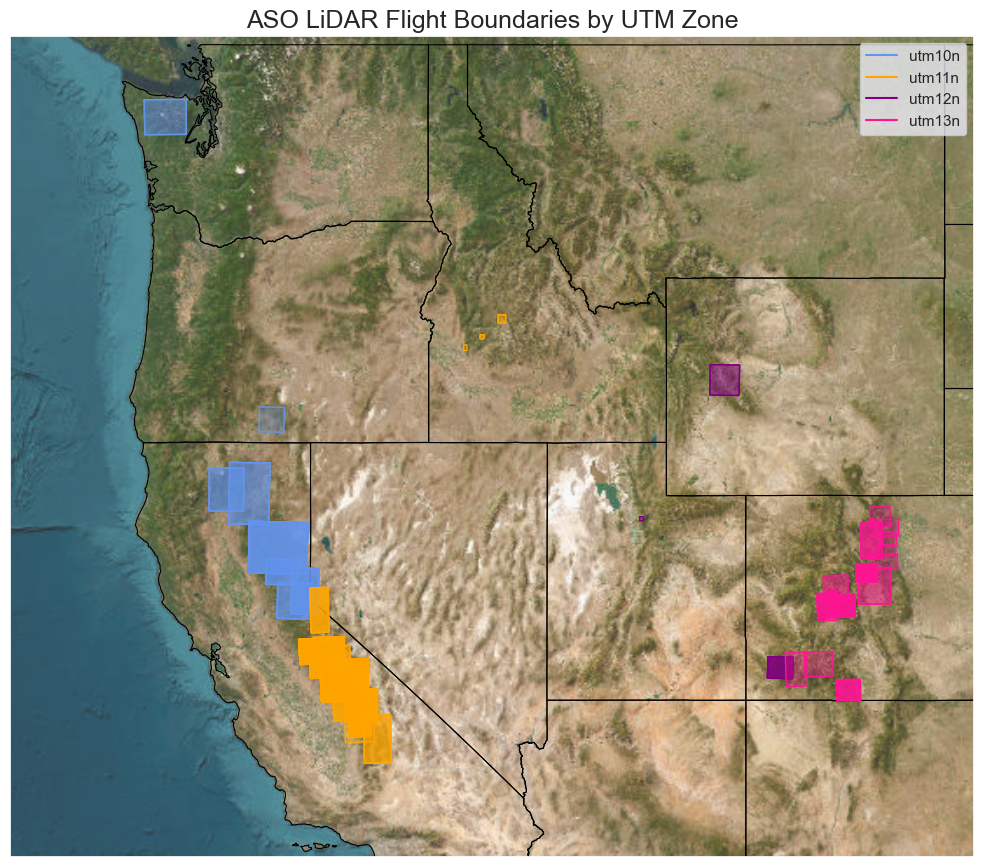

In [170]:
import matplotlib.lines as mlines
fig, ax = plt.subplots(figsize=(10, 10))
states = gpd.read_file(r"C:\Users\JackE\uw\STV\data\cb_2018_us_state_5m")
states.to_crs(3857).plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.8)
# Define the colors
colors = {
    'gf_utm10_bounds': ('cornflowerblue', (0.39, 0.58, 0.93, 0.3)),  # RGBA for transparency
    'gf_utm11_bounds': ('orange', (1.0, 0.65, 0.0, 0.3)),
    'gf_utm12_bounds': ('purple', (0.5, 0.0, 0.5, 0.3)),
    'gf_utm13_bounds': ('deeppink', (1.0, 0.08, 0.58, 0.3)),
}

# Plot each GeoDataFrame with specified colors
gf_utm10_bounds.plot(ax=ax, facecolor=colors['gf_utm10_bounds'][1], edgecolor=colors['gf_utm10_bounds'][0])
gf_utm11_bounds.plot(ax=ax, facecolor=colors['gf_utm11_bounds'][1], edgecolor=colors['gf_utm11_bounds'][0])
gf_utm12_bounds.plot(ax=ax, facecolor=colors['gf_utm12_bounds'][1], edgecolor=colors['gf_utm12_bounds'][0])
gf_utm13_bounds.plot(ax=ax, facecolor=colors['gf_utm13_bounds'][1], edgecolor=colors['gf_utm13_bounds'][0])

ax.set_xlim(-1.42e7, -1.15e7)
ax.set_ylim(4e6, 6.3e6)

# Add the basemap
ctx.add_basemap(ax, crs=3857, source=ctx.providers.Esri.WorldImagery, alpha=0.8, attribution=False)

# Remove gridlines, ticks, and labels
ax.grid(False)
ax.set_xticks([])  # Remove x ticks
ax.set_yticks([])  # Remove y ticks
ax.set_xlabel('')   # Remove x label
ax.set_ylabel('')   # Remove y label

# Create custom legend handles
handles = [
    mlines.Line2D([], [], color=colors['gf_utm10_bounds'][0], label='utm10n'),
    mlines.Line2D([], [], color=colors['gf_utm11_bounds'][0], label='utm11n'),
    mlines.Line2D([], [], color=colors['gf_utm12_bounds'][0], label='utm12n'),
    mlines.Line2D([], [], color=colors['gf_utm13_bounds'][0], label='utm13n'),
]

# Add the legend to the plot
ax.legend(handles=handles, loc='upper right')
ax.set_title("ASO LiDAR Flight Boundaries by UTM Zone", fontsize=18)
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\aso_utm_extent.png", dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [171]:
def get_bounds_time_gf(path):
    result_gf = gpd.GeoDataFrame(geometry='geometry', columns=['year','geometry'], crs=3857)
    # List all .tif files in the directory
    tif_files = [os.path.join(path, f) for f in os.listdir(path) if f.endswith('.tif')]
    # Iterate over each tif file
    for tif_file in tif_files:
        with rasterio.open(tif_file) as src:
            year = int(tif_file.split('_')[-2][:4])
            # Get the bounds of the tif file (left, bottom, right, top)
            bounds = src.bounds
            bounds_box = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
            row = {'year':[year], 'geometry':[bounds_box]}
            gf_bounds = gpd.GeoDataFrame(row , geometry='geometry', crs=src.crs)
            gf_bounds = gf_bounds.to_crs(3857)
            result_gf = pd.concat([result_gf, gf_bounds], ignore_index=True)
    return result_gf.reset_index(drop=True)

In [172]:
gf_utm10_bounds = get_bounds_time_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm10n")
gf_utm11_bounds = get_bounds_time_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm11n")
gf_utm12_bounds = get_bounds_time_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm12n")
gf_utm13_bounds = get_bounds_time_gf(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm13n")

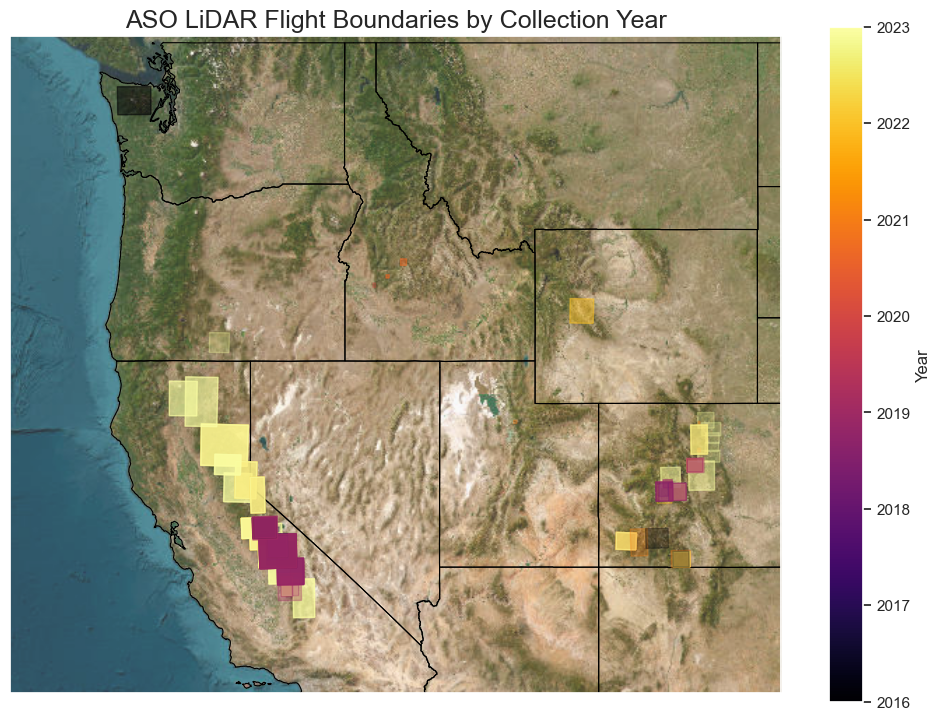

In [173]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

fig, ax = plt.subplots(figsize=(10, 10))
states = gpd.read_file(r"C:\Users\JackE\uw\STV\data\cb_2018_us_state_5m")
states.to_crs(3857).plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.8)
# Define the color map
cmap = plt.get_cmap('inferno')

# Normalize the 'time' values for color mapping
norm = plt.Normalize(vmin=2016, vmax=2023)

# Create a color bar and set its properties
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Only needed for older versions of matplotlib

# Plot each GeoDataFrame with colors based on the 'time' column
for gdf in [gf_utm10_bounds, gf_utm11_bounds, gf_utm12_bounds, gf_utm13_bounds]:
    # Assign colors based on the 'year' column
    face_colors = [cmap(norm(year)) for year in gdf['year']]
    
    # Plot the GeoDataFrame with transparency (alpha=0.5)
    gdf.plot(ax=ax, facecolor=face_colors, edgecolor=face_colors, alpha=0.3)

ax.set_xlim(-1.42e7, -1.15e7)
ax.set_ylim(4e6, 6.3e6)

# Add the basemap
ctx.add_basemap(ax, crs=3857, source=ctx.providers.Esri.WorldImagery, alpha=0.8, attribution=False)

# Remove gridlines, ticks, and labels
ax.grid(False)
ax.set_xticks([])  # Remove x ticks
ax.set_yticks([])  # Remove y ticks
ax.set_xlabel('')   # Remove x label
ax.set_ylabel('')   # Remove y label

# Add color bar
cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Year')
cbar.set_ticks(np.arange(2016, 2024))  # Set ticks for each year
cbar.ax.set_yticklabels(np.arange(2016, 2024))  # Set tick labels for years
ax.set_title("ASO LiDAR Flight Boundaries by Collection Year", fontsize=18)
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\aso_year_extent.png", dpi=300, bbox_inches='tight')
plt.show()

### Now let's do the data product contents

In [97]:
import xarray as xr
from shapely.geometry import box
import geopandas as gpd
import contextily as ctx
import rasterio as rio
import torch

In [2]:
# pick a random site
aso_lidar_path = r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\ASO_50m_SD_cleaned\utm13n\ASO_50M_SD_Gunnison_20220421_clean.tif"

In [11]:
aso_ds = xr.open_dataset(aso_lidar_path).squeeze()
aso_ds = aso_ds.rename({'band_data': 'aso_sd'})
aso_ds['aso_sd'] = aso_ds['aso_sd'].where(aso_ds['aso_sd'] >= 0)

c:\Users\JackE\anaconda3\envs\JackConda\Lib\site-packages\xarray\backends\plugins.py:159: RuntimeWarning: 'ee' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)


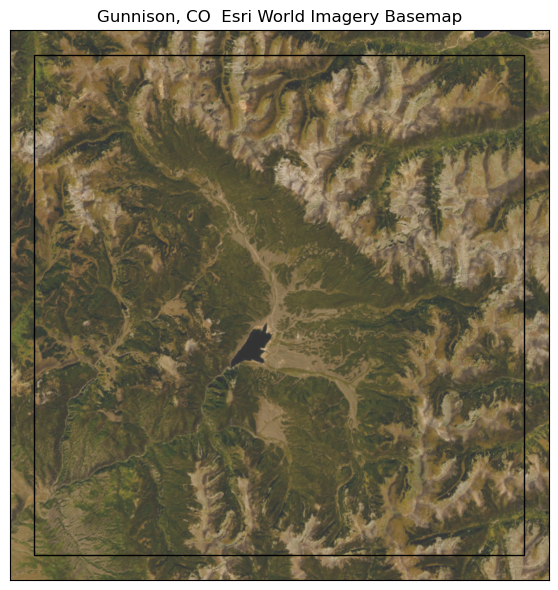

In [68]:
fig, ax = plt.subplots(figsize=(6, 6))
bbox = aso_ds.aso_sd.rio.bounds()
bounds_box = box(bbox[0], bbox[1], bbox[2], bbox[3])
gpd.GeoSeries(bounds_box).plot(ax=ax, facecolor='none', edgecolor='black')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
#ax.set_xlim(340000, 390000)
#ax.set_ylim(4.28e6, 4.34e6)
ax.set_title('Gunnison, CO  Esri World Imagery Basemap')
ctx.add_basemap(ax=ax, crs=aso_ds.rio.crs, source=ctx.providers.Esri.WorldImagery, alpha=0.8, attribution=False)
plt.tight_layout()
plt.show()

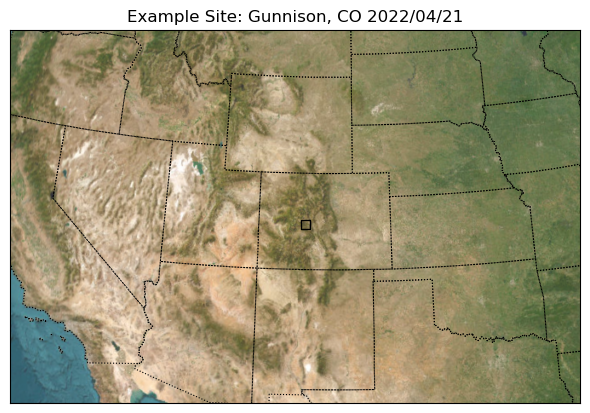

In [113]:
fig, ax = plt.subplots(figsize=(6, 6))
states = gpd.read_file(r"C:\Users\JackE\uw\STV\data\cb_2018_us_state_5m")
states.to_crs(aso_ds.rio.crs).plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.8, linestyle=":")
bbox = aso_ds.aso_sd.rio.bounds()
bounds_box = box(bbox[0], bbox[1], bbox[2], bbox[3])
gpd.GeoSeries(bounds_box).plot(ax=ax, facecolor='none', edgecolor='black')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xlim(-1e6, 1.63e6)
ax.set_ylim(3.48e6 , 5.2e6)
ax.set_title('Example Site: Gunnison, CO 2022/04/21')
ctx.add_basemap(ax=ax, crs=aso_ds.rio.crs, source=ctx.providers.Esri.WorldImagery, alpha=0.8, attribution=False)
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\example_site_extent.png", dpi=300, bbox_inches='tight')
plt.show()

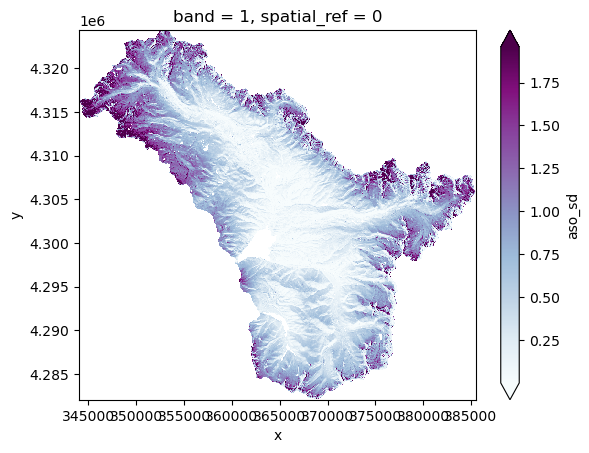

In [14]:
aso_ds.aso_sd.plot(cmap='BuPu', robust=True)

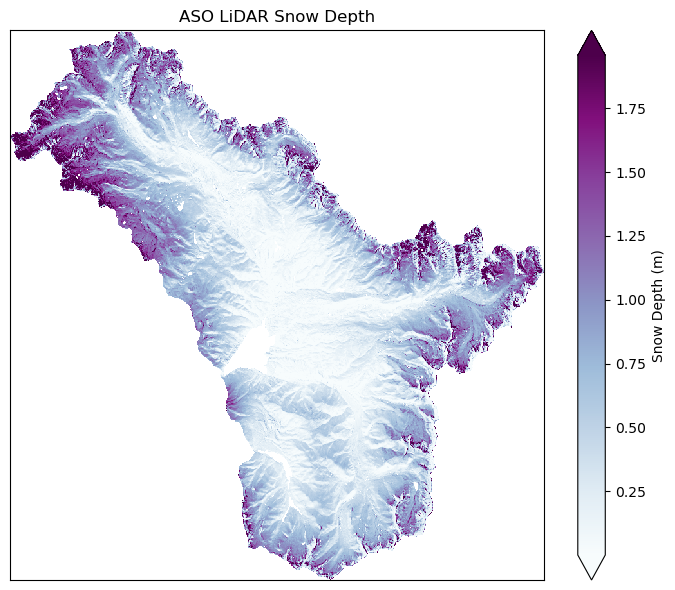

In [114]:
fig, ax = plt.subplots(figsize=(7, 6))
aso_ds.aso_sd.plot(ax=ax, cmap='BuPu', robust=True, cbar_kwargs={'label': 'Snow Depth (m)'})
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('ASO LiDAR Snow Depth')
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\site_aso.png", dpi=300, bbox_inches='tight')
plt.show()

In [69]:
dem_path = r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\cop30\cop30_for_ASO_50M_SD_Gunnison_20220421_clean.nc"

In [74]:
dem_ds = xr.open_dataset(dem_path).squeeze()
dem_ds = dem_ds.rio.write_crs(aso_ds.rio.crs)
dem_ds = dem_ds.rename({'__xarray_dataarray_variable__': 'elevation'})
dem_ds = dem_ds.rio.reproject_match(aso_ds, resampling=rio.enums.Resampling.bilinear, crs=aso_ds.rio.crs)

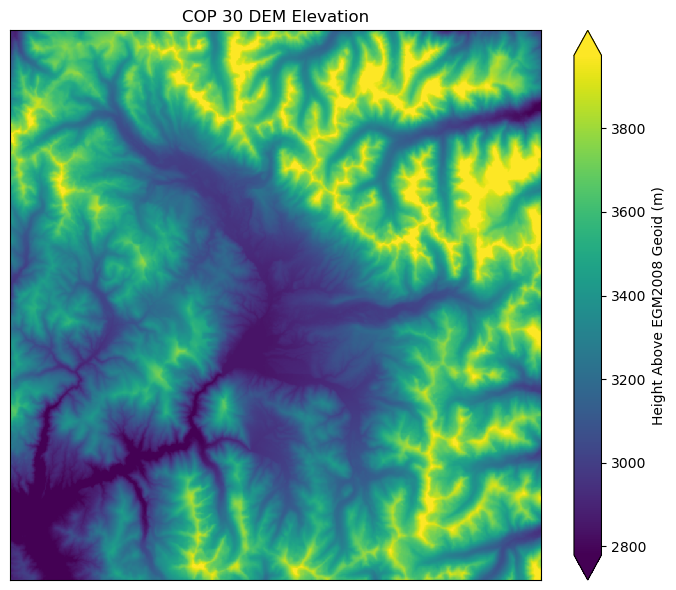

In [115]:
fig, ax = plt.subplots(figsize=(7, 6))
dem_ds.elevation.plot(cmap='viridis', robust=True, cbar_kwargs={'label': 'Height Above EGM2008 Geoid (m)'})
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('COP 30 DEM Elevation')
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\site_cop30.png", dpi=300, bbox_inches='tight')
plt.show()

In [81]:
S1_snowon_ds = xr.open_dataset(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\S1_rtc\S1_snow-on_20220418_for_ASO_50M_SD_GunnisonTaylor_20220421_clean.nc").squeeze()
S1_snowon_ds = S1_snowon_ds.rename({'vv': 'snowon_vv', 'vh':'snowon_vh'})
S1_snowon_ds = S1_snowon_ds.rio.reproject_match(aso_ds, resampling=rio.enums.Resampling.bilinear, crs=aso_ds.rio.crs)
S1_snowoff_ds = xr.open_dataset(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\S1_rtc\S1_snow-off_20210914_for_ASO_50M_SD_Gunnison_20220421_clean.nc").squeeze()
S1_snowoff_ds = S1_snowoff_ds.rename({'vv': 'snowoff_vv', 'vh':'snowoff_vh'})
S1_snowoff_ds = S1_snowoff_ds.rio.reproject_match(aso_ds, resampling=rio.enums.Resampling.bilinear, crs=aso_ds.rio.crs)

In [134]:
np.nanmin(S1_snowon_ds.snowon_vv.values)

0.004854793

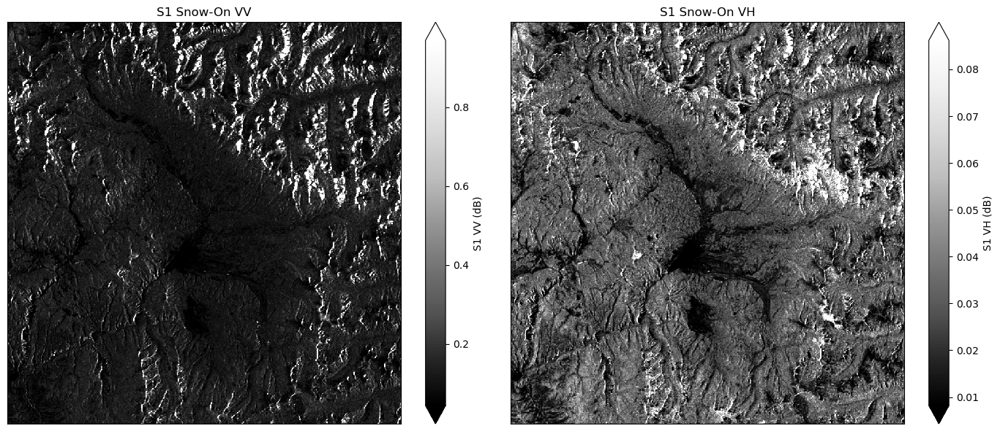

In [152]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
S1_snowon_ds.snowon_vv.plot(ax=axs[0], cmap='Greys_r', robust=True, cbar_kwargs={'label': 'S1 VV (dB)','ticks': [0.2,0.4,0.6,0.8]})
axs[0].set_title('S1 Snow-On VV')
S1_snowon_ds.snowon_vh.plot(ax=axs[1], cmap='Greys_r', robust=True, cbar_kwargs={'label': 'S1 VH (dB)'})
axs[1].set_title('S1 Snow-On VH')
for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\site_snow-on.png", dpi=300, bbox_inches='tight')
plt.show()

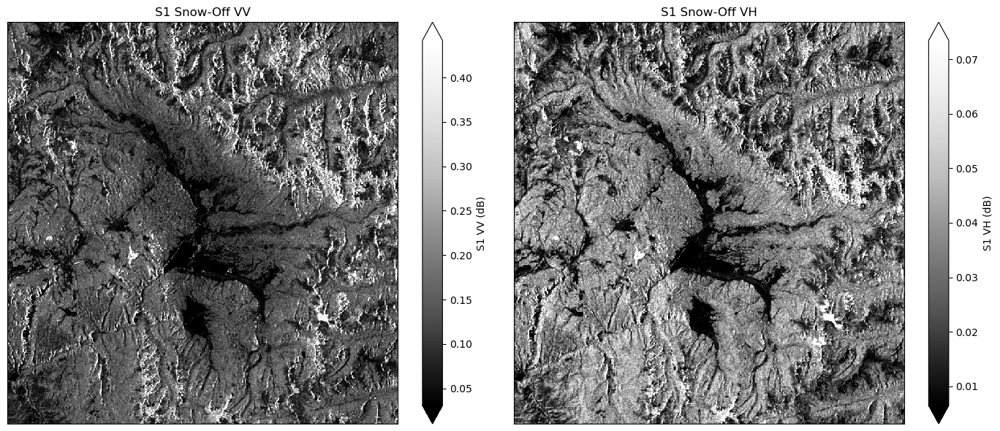

In [153]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
S1_snowoff_ds.snowoff_vv.plot(ax=axs[0], cmap='Greys_r', robust=True, cbar_kwargs={'label': 'S1 VV (dB)'})
axs[0].set_title('S1 Snow-Off VV')
S1_snowoff_ds.snowoff_vh.plot(ax=axs[1], cmap='Greys_r', robust=True, cbar_kwargs={'label': 'S1 VH (dB)'})
axs[1].set_title('S1 Snow-Off VH')
for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\site_snow-off.png", dpi=300, bbox_inches='tight')
plt.show()

In [88]:
S2_ds = xr.open_dataset(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\sentinel_2\20220421_for_ASO_50M_SD_Gunnison_20220421_clean.nc").squeeze()
S2_ds = S2_ds.rio.write_crs(aso_ds.rio.crs)
S2_ds = S2_ds.rio.reproject_match(aso_ds, resampling=rio.enums.Resampling.bilinear, crs=aso_ds.rio.crs) 

In [93]:
S2_ds

<xarray.Dataset> Size: 45MB
Dimensions:      (x: 830, y: 847)
Coordinates:
    time         datetime64[ns] 8B 2022-04-21T17:48:59.024000
    band         int32 4B 1
    spatial_ref  int32 4B 0
  * x            (x) float64 7kB 3.441e+05 3.441e+05 ... 3.855e+05 3.855e+05
  * y            (y) float64 7kB 4.324e+06 4.324e+06 ... 4.282e+06 4.282e+06
Data variables: (12/16)
    AOT          (y, x) float32 3MB 104.0 104.5 104.9 104.9 ... 88.0 88.0 88.0
    B01          (y, x) float32 3MB 3.976e+03 4.49e+03 ... 8.141e+03 8.284e+03
    B02          (y, x) float32 3MB 4.629e+03 5.362e+03 ... 8.804e+03 8.84e+03
    B03          (y, x) float32 3MB 5.057e+03 5.841e+03 ... 9.295e+03 9.349e+03
    B04          (y, x) float32 3MB 5.448e+03 6.268e+03 ... 9.674e+03 9.724e+03
    B05          (y, x) float32 3MB 5.742e+03 6.586e+03 ... 9.787e+03 9.845e+03
    ...           ...
    B11          (y, x) float32 3MB 1.772e+03 1.486e+03 ... 1.195e+03 1.182e+03
    B12          (y, x) float32 3MB 1.634e+03 1.391e+03 ... 1.176e+03 1.165e+03
    B8A          (y, x) float32 3MB 5.539e+03 6.061e+03 ... 8.399e+03 8.429e+03
    SCL          (y, x) float32 3MB 11.0 11.0 11.0 11.0 ... 11.0 11.0 11.0 11.0
    WVP          (y, x) float32 3MB 528.0 561.1 516.6 ... 351.9 360.4 359.4
    visual       (y, x) float32 3MB 249.6 254.6 254.0 ... 255.0 255.0 255.0

In [110]:
# Convert the DataArray objects to PyTorch tensors
B04_tensor = torch.tensor(S2_ds.B04.values)
B03_tensor = torch.tensor(S2_ds.B03.values)
B02_tensor = torch.tensor(S2_ds.B02.values)

# Perform the normalization and add an extra dimension for RGB channels
norm_max = np.max([B04_tensor.max(), B03_tensor.max(), B02_tensor.max()])
B04_tensor = (B04_tensor / norm_max).unsqueeze(2)  # Add a channel dimension
B03_tensor = (B03_tensor / norm_max).unsqueeze(2)  # Add a channel dimension
B02_tensor = (B02_tensor / norm_max).unsqueeze(2)  # Add a channel dimension

# Concatenate along the third dimension (channel)
rgb_tensor = torch.cat((B04_tensor, B03_tensor, B02_tensor), dim=2).squeeze()


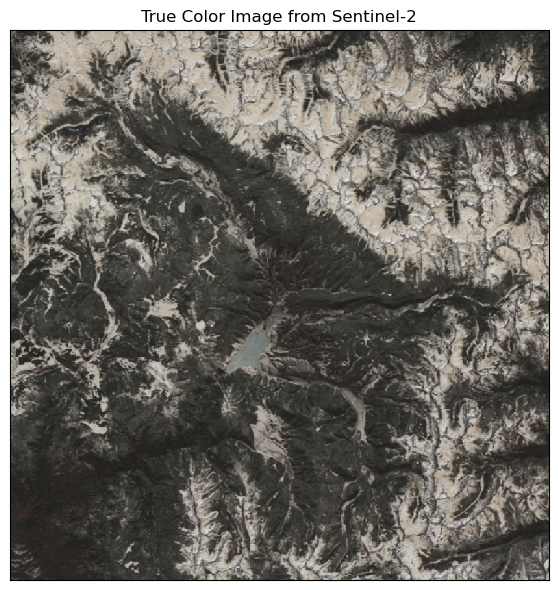

In [116]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(rgb_tensor, interpolation='none')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('True Color Image from Sentinel-2')
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\site_s2.png", dpi=300, bbox_inches='tight')
plt.show()

In [154]:
fcf_ds = xr.open_dataset(r"C:\Users\JackE\uw\courses\aut24\ml_geo\final_data\fcf\fcf_for_ASO_50M_SD_Gunnison_20220421_clean.nc").squeeze()
fcf_ds = fcf_ds.rename({'__xarray_dataarray_variable__': 'fcf'})
fcf_ds = fcf_ds.rio.reproject_match(aso_ds, resampling=rio.enums.Resampling.bilinear, crs=aso_ds.rio.crs)

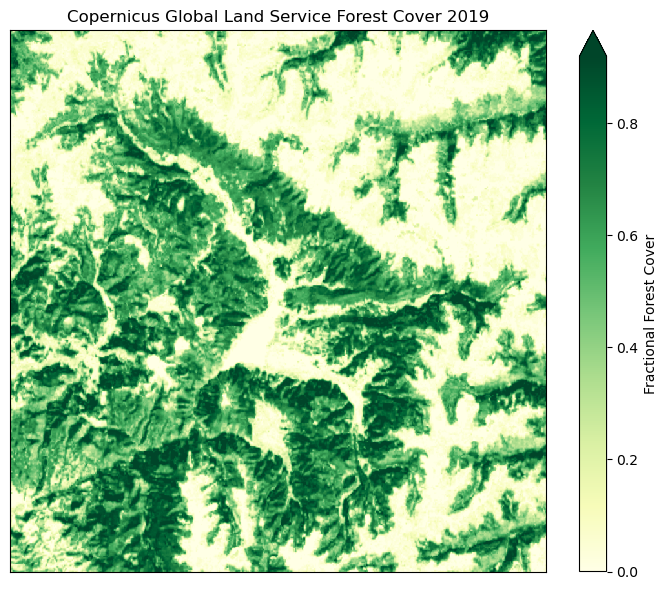

In [160]:
fig, ax = plt.subplots(figsize=(7, 6))
fcf_ds.fcf.plot(ax=ax, cmap='YlGn', robust=True, cbar_kwargs={'label': 'Fractional Forest Cover'})
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Copernicus Global Land Service Forest Cover 2019')
plt.tight_layout()
plt.savefig(r"C:\Users\JackE\uw\courses\aut24\wda\final\images\hw4\site_fcf.png", dpi=300, bbox_inches='tight')